# Exam parameter detection

DICOM data contains imaging pixels and associated metadata. It contains a wealth of information about medical imaging exams and can be used for diagnosis, treatment planning, and research. However, DICOM data can be inconsistent due to differences in equipment, software, technician training and practices. These inconsistencies can lead to errors in determining exam parameters such as acquisition protocol, exam technique, body part, slice thickness, contrast phase, etc. This can affect the accuracy of routing and presenting of the imaging studies.

In this notebook we will examine a real world dataset of MRI studies, identify some inconsistencies, and see how we can infer some exam parameters from pixel data using Microsoft's foundational AI model called MedImageInsight. The notebook shows a few-shot approach to derive exam parameters from new MRI series given a labeled reference dataset. This approach can be very efficient as it requires some initial investment into pre-computing of image embeddings, and relatively inexpensive computation of data clusters followed by matching of each new image to those clusters. 

Note that this code is not intended to provide a finished system for exam parameter detection or a conduct a detailed analysis of fitness of the MedImageInsight foundational model for the task, but rather present a few key ideas and demonstrate how a foundational embedding model can drastically simplify the task.

At a high level, it represents the following flow.

1. Create embeddings for every image in a reference dataset using the Florence endpoint
2. Label all images in a reference dataset with class attributes, either manually, or use GPT to derive those from the combination of report and DICOM metadata
3. Using UMAP technique, discover clusters corresponding to the exam parameter groups
4. For new images, find the closest cluster and derive exam parameters from those known from the cluster

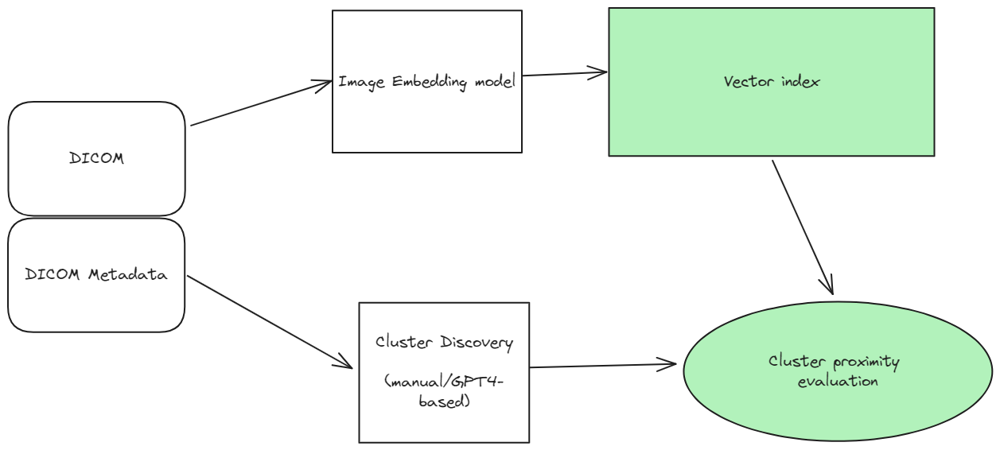

# 1. Instructions to Reproduce the Notebook

1. **Run in Azure ML Environment**:
   - The easiest way to reproduce this notebook is to run it inside the Azure Machine Learning environment.

2. **Set Up Environment**:  
   - Install the required libraries. For convenience we provide the Conda environment definition file: [`examparamdetection_conda_environment.yml`](./examparamdetection_conda_environment.yml).

3. **Download the sample data**:  
   - Use the following command to download the dataset with samples into your working folder. Once you download, make sure the files are in the `data` directory located in the same directory as this notebook so that all paths in this sample work out of the box.  

      `azcopy copy --recursive https://azuremlexampledata.blob.core.windows.net/data/healthcare-ai/medimageinsight-examparameter/* ./data`


4. **Data Assets**:  
   We are not providing the original DICOM files, but rather are providing the following:
   - DICOM tags extracted into a CSV file named `data/mri_sample_features-csm.csv`. Each row in this file represents a single MRI series.
   - Embedding vectors and some slices used for visualization are provided in the above sample data.  In this data you will find:  
       - Embedding vectors serialized as .pkl files in the: `data/feature_vectors` directory
       - .png files of several slices from the original MRI dataset that we use for visualization in the `data/pngs` directory
   
5. **GPT-Based Weak Labeling**:  
   During one of the steps in this notebook we will use GPT4 model to create ground truth labels for our dataset. This step requires a separate deployment of GPT4 and takes about 30 minutes to complete. If you want to run it, you should:
   - Ensure that the GPT-4 endpoint is provisioned for GPT-based weak labeling.
   - Specify the parameters (endpoint and API key) in the `environment.json` file.
   
   If you cannot run this step, you can use pre-computed labels, load them and continue with the notebook execution. The pre-computed labels are available in the following file:
     `data/gpt_labeled_mri.json`

6. **Execution Environment**:  
   - All the code below can be executed on a standard CPU-based notebook VM. 

In [1]:
# Imports
import os
from pprint import pprint
import pandas as pd
import exam_parameter_helpers as helpers
import json
from umap import UMAP


# 2. Dataset setup and exploration

First, let's learn something about our dataset. How many series? What kinds of series? How large are they? What is the distribution of parameters of interest?

In [2]:
# Please use full path for dataset_root to the folder:
repo_root = r"."
dataset_root = os.path.join(repo_root, "data")
gpt_labeled_mri_file_name = os.path.join(dataset_root, "gpt_labeled_mri.json")


In [3]:
# Load pre-parsed metadata. Each row represents single MRI series
df_mri = pd.read_csv(os.path.join(dataset_root, "mri_sample_features-sm.csv"))


Let's see how many series we have. The table we got has most of DICOM metadata extracted into it - that's the 2nd dimension

In [4]:
series_num, metadata_fields = df_mri.shape
print(f"Total series: {series_num}\nMetadata fields: {metadata_fields}")


Total series: 74
Metadata fields: 99


Now let's see how many images per series

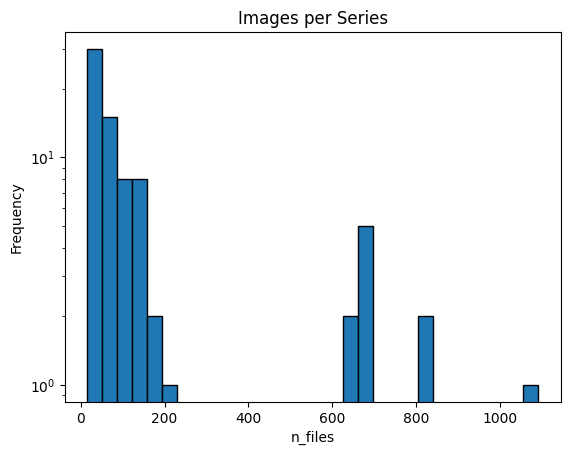

In [5]:
helpers.plot_parameter_distribution_histogram(
    df_mri, "n_files", "Images per Series", 30, logscale=True
)


Which ones are the larger series?

In [6]:
large_series = df_mri[df_mri["n_files"] > 600].sort_values(by="n_files")
print(
    large_series[["SeriesDescription", "BodyPartExamined", "SliceThickness", "n_files"]]
)


             SeriesDescription BodyPartExamined  SliceThickness  n_files
56            DYNAMIC PRE/POST              NaN             3.3      638
65                        SUBS           BREAST             1.0      640
15            DYNAMIC PRE POST           PELVIS             3.0      696
16            DYNAMIC PRE POST           PELVIS             3.0      696
22            DYNAMIC PRE POST           PELVIS             3.0      696
33            DYNAMIC PRE POST           PELVIS             4.0      696
44            DYNAMIC PRE POST           PELVIS             3.0      696
31            DYNAMIC PRE POST           PELVIS             3.0      812
42            DYNAMIC PRE POST           PELVIS             3.0      812
34  DYNAMIC PRE POST GRASP_RED           PELVIS             3.0     1092


Let's see the distribution of body parts examined according to the "Body Part Examined" DICOM tag

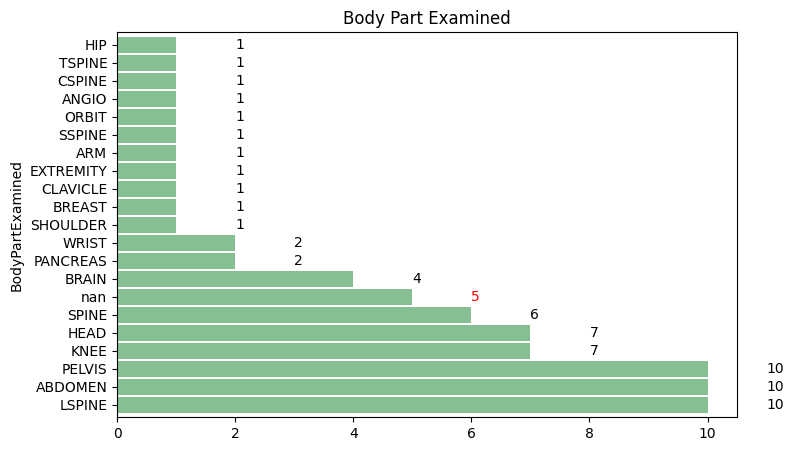

In [7]:
helpers.plot_parameter_distribution_categorical(
    df_mri, "BodyPartExamined", "Body Part Examined"
)


Here we are starting to see some issues with tags in real-world DICOM data. These are all MRI studies. Can you rely on this tag to determine which body part is present in each study? Is "Brain" the same as "Head"? Is "Shoulder" same as "Clavicle"? What body part is in the series labeled as "Angio"?

Now let's set aside a few series with different body parts examined:

In [8]:
holdout_set = {}
# clean up leading and trailing whitespaces
df_mri["BodyPartExamined"] = df_mri["BodyPartExamined"].str.strip()


In [9]:
selected_entries = helpers.sample_holdout_set(
    df_mri, "BodyPartExamined", ["PELVIS", "SPINE", None], 
)

holdout_set["BodyPartExamined"] = selected_entries.copy()

print(selected_entries[["BodyPartExamined", "SliceThickness", "n_files"]])


   BodyPartExamined  SliceThickness  n_files
42           PELVIS             3.0      812
31           PELVIS             3.0      812
44           PELVIS             3.0      696
33           PELVIS             4.0      696
42           PELVIS             3.0      812
32            SPINE             4.0       25
50            SPINE             3.0       40
20            SPINE             4.0       27
50            SPINE             3.0       40
50            SPINE             3.0       40
56              NaN             3.3      638
67              NaN             3.5       80
29              NaN             4.0       93
67              NaN             3.5       80
67              NaN             3.5       80


We can see something else here too - in some series the BodyPartExamined tag is not set at all which makes the further case for a better system to use pixel data to determine the body part imaged. 

Now let's look at the ProtocolName parameter to see what information our DICOMs contain about the imaging protocol used - another freeform text field that often is a source of inconsistencies.

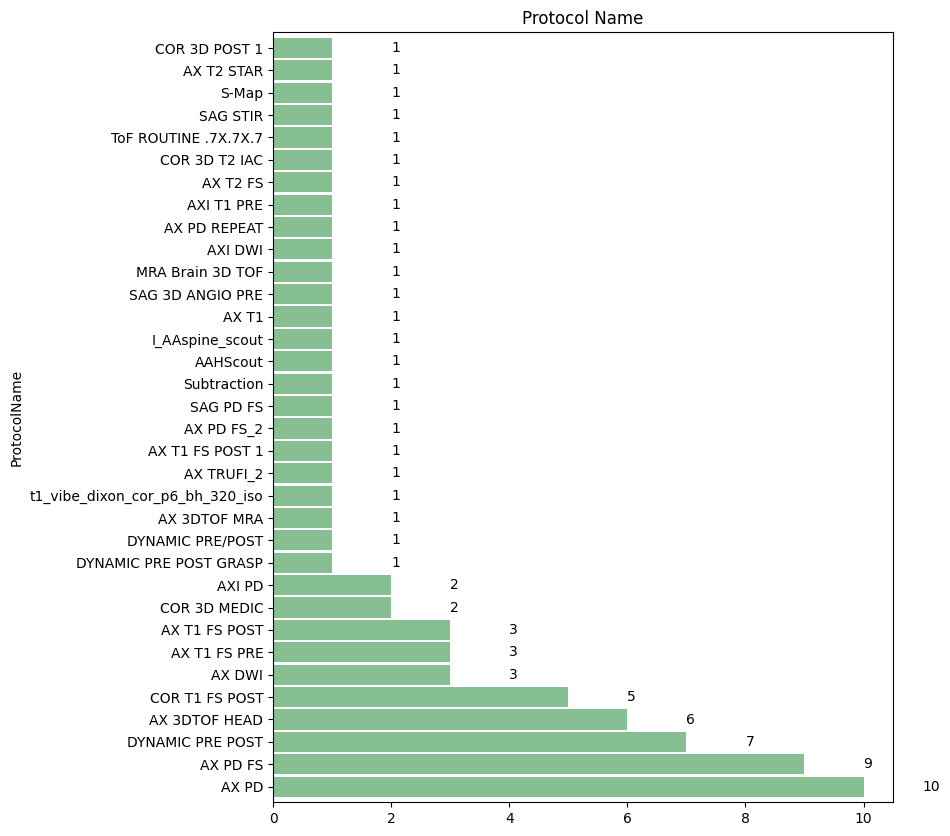

In [10]:
helpers.plot_parameter_distribution_categorical(
    df_mri, "ProtocolName", "Protocol Name", height=10
)


Similarly to the body part we can observe a lot of variety in naming of the protocols and little consistency. Let's set some aside and look at Series Description since typically this field contains additional information about the imaging technique and protocol used.

In [11]:
df_mri["ProtocolName"] = df_mri["ProtocolName"].str.strip()

selected_entries = helpers.sample_holdout_set(
    df_mri, "ProtocolName", ["DYNAMIC PRE POST", "AX PD FS", "AX PD"]
)

holdout_set["ProtocolName"] = selected_entries.copy()

print(selected_entries[["BodyPartExamined", "SliceThickness", "n_files"]])


   BodyPartExamined  SliceThickness  n_files
44           PELVIS             3.0      696
31           PELVIS             3.0      812
33           PELVIS             4.0      696
44           PELVIS             3.0      696
22           PELVIS             3.0      696
69             KNEE             3.0       50
37             KNEE             3.0       54
71              HIP             3.0       34
38             KNEE             3.0       40
69             KNEE             3.0       50
47           LSPINE             4.0       27
14           CSPINE             4.0       29
51         SHOULDER             3.0       28
26           LSPINE             4.0       28
47           LSPINE             4.0       27


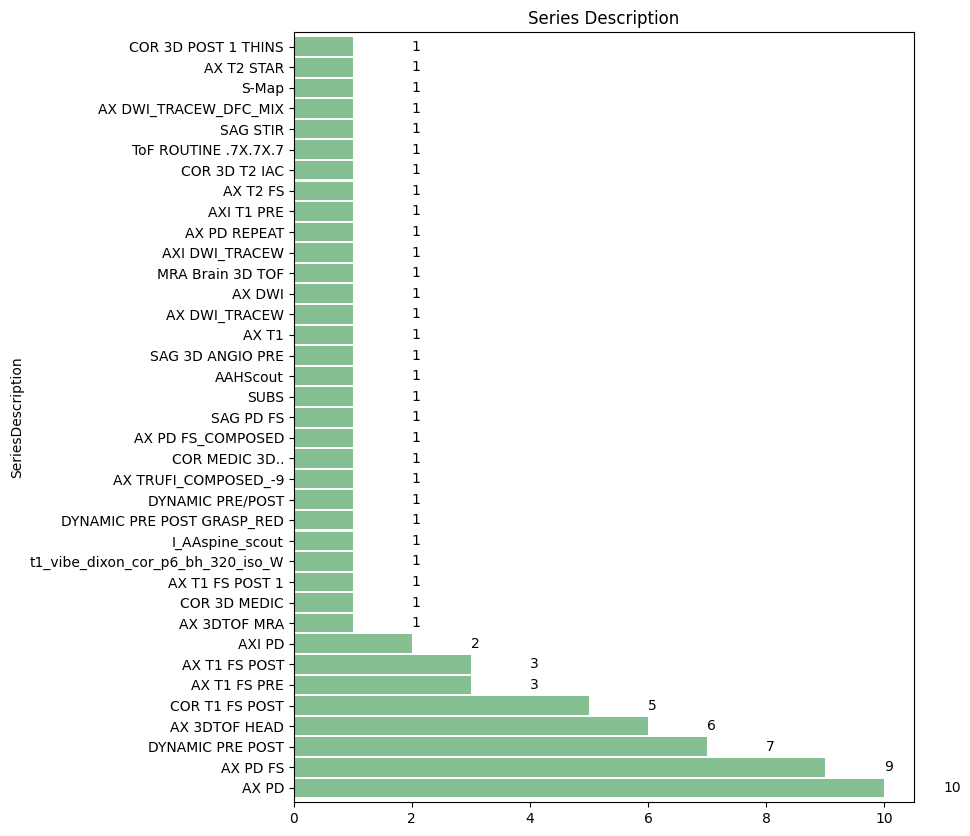

In [12]:
helpers.plot_parameter_distribution_categorical(
    df_mri, "SeriesDescription", "Series Description", height=10
)


Similarly, little consistency, and some overlap with Protocol Name field since we can see information here about imaging techniques and protocols (scout, proton density, axial vs coronal, FLAIR, etc). Let's set some aside.



In [13]:
df_mri["SeriesDescription"] = df_mri["SeriesDescription"].str.strip()

selected_entries = helpers.sample_holdout_set(
    df_mri, "SeriesDescription", ["AXI PD", "AX DWI_TRACEW", "AX PD"], 
)

holdout_set["SeriesDescription"] = selected_entries.copy()

print(selected_entries[["BodyPartExamined", "SliceThickness", "n_files"]])


   BodyPartExamined  SliceThickness  n_files
24           LSPINE             4.0       25
25           LSPINE             4.0       25
24           LSPINE             4.0       25
24           LSPINE             4.0       25
24           LSPINE             4.0       25
30            ANGIO             5.0       48
30            ANGIO             5.0       48
30            ANGIO             5.0       48
30            ANGIO             5.0       48
30            ANGIO             5.0       48
47           LSPINE             4.0       27
14           CSPINE             4.0       29
51         SHOULDER             3.0       28
26           LSPINE             4.0       28
47           LSPINE             4.0       27


# 3. Ontology mapping


Now we would like to see if we can avoid costly labeling and help infer exam parameters from DICOM tags. Note that in real world this would be the first step to obtain ground truth, it would need further cleanup and refinement by professionals to obtain proper ground truth. 

Here we will, for the sake of learning about the capabilities of embedding models, imagine that the ground truth that we obtain through this process is good enough. 

We will ask GPT4 to go from DICOM fields like this:
```
    "Body Part Examined": "ABDOMEN",
    "Protocol Name": "COR T1 FS POST",
    "Series Description": "COR T1 FS POST",
    "Image Type": "ORIGINAL\\PRIMARY\\M\\NORM\\DIS2D ",
    "Sequence Variant": "SP\\OSP"
```

to something like this: 

```
    "Body Part Examined": "ABDOMEN",
    "Plane of Imaging": "CORONAL",
    "Protocol Used": "T1_PD_FS"
```
            
We will be using access our GPT4o deployment from Azure OpenAI and ask it to provide those labels. Please refer to the [Azure AI Studio documentation](https://learn.microsoft.com/en-us/azure/ai-studio/how-to/deploy-models-openai) for details on how to deploy GPT4 model and obtain the endpoint URL and API key. 

In [14]:
# We will call this function to submit system prompt and user prompt to our GPT4 deployment
def get_gpt_label(client, obj):
    deployment = "gpt-4o"

    response = client.chat.completions.create(
        model=deployment,
        response_format={"type": "json_object"},
        messages=[
            {
                "role": "system",
                "content": "You will be given a JSON object of DICOM fields which contain information about exam parameters. "
                "This information is hard to parse, sometimes missing sometimes uses acronyms or codes. To the best of your ability"
                " and knowledge about DICOM and medical imaging protocols, please"
                " output a new JSON object answering the following questions as JSON fields: "
                " What was the body part examined? What was the plane of imaging? What was the protocol used?."
                " Where the DICOM fields do not answer this information, write 'unknown'. "
                "You will be providing this information for multiple JSON objects, so please use limited"
                " glossary of categories for your answers. Try to be consistent and limited in choice of answers as they will be "
                "applied across many input objects to label them better. Try to expand acronyms if you are confident in their meaning."
                " Only use uppercase for answers. Here are some extra tips: "
                "PD in MRI stands for Proton Density",
            },
            {"role": "user", "content": obj},
        ],
    )

    return response.choices[0].message.content


In [15]:
# This code will try to load the endpoint and API key from environment.json.
# If you would like to execute the GPT4-based labeling, please provide the values by editing environment.json file or as environment variables.
# Otherwise you may skip this cell and use the pre-labeled data provided in the repository.
oai_client = helpers.create_openai_client()


Let's try out our prompt

In [17]:
item = df_mri.iloc[25]

response = get_gpt_label(
    oai_client, helpers.create_exam_param_struct_from_dicom_tags(item)
)

print(response)


{
  "Body Part Examined": "LUMBAR SPINE",
  "Plane of Imaging": "AXIAL",
  "Protocol Used": "PROTON DENSITY"
}


Looking good, let's run all our items through this (_warning, this will take ~30 minutes with 250 items_). Uncomment the following cells if you want to execute this.

In [18]:
# labels_dict = []
# for index, item in df_mri.iterrows():
#     weak_label = helpers.create_exam_param_struct_from_dicom_tags(item)
#     gpt_response = get_gpt_label(oai_client, weak_label)

#     obj = {}
#     obj["SeriesInstanceUID"] = item["SeriesInstanceUID"]
#     obj["id"] = index
#     obj["gpt_label"] = gpt_response
#     obj["weak_label"] = weak_label
#     print(obj)
#     labels_dict.append(obj)


Now let's save all those GPT-derived labels into a file, we will use them later

In [19]:
gpt_labeled_mri_file_name = os.path.join(dataset_root, "gpt_labeled_mri.json")

# reorganize output for better formatting (turn strings that GPT returned into objects) and save to a file

# labels_dict_obj = []
# for entry in labels_dict:
#     labels_dict_obj.append(entry)
#     labels_dict_obj[-1]["gpt_label"] = json.loads(entry['gpt_label'])
#     labels_dict_obj[-1]["weak_label"] = json.loads(entry['weak_label'])

# with open(gpt_labeled_mri_file_name, 'w') as file:
#     json.dump(labels_dict_obj, file, indent=4)


Let's take another look at GPT-derived labels and visually inspect the quality of our labeling. If you chose not to run the labeling, you can still run all the following cells as here we will read the provided file.

In [20]:
# Read the file if no need to re-run the labeling
with open(gpt_labeled_mri_file_name, "r") as file:
    labels_dict_obj = json.load(file)

# Print several entries to see the structure
pprint(labels_dict_obj[5:9])


[{'SeriesInstanceUID': '1.3.6.1.4.1.55648.9271509911215736097430470298655235.6',
  'gpt_label': {'Body Part Examined': 'ABDOMEN',
                'Plane of Imaging': 'AXIAL',
                'Protocol Used': 'DIFFUSION WEIGHTED IMAGING'},
  'id': 5,
  'weak_label': {'Body Part Examined': 'ABDOMEN',
                 'Image Type': 'DERIVED\\PRIMARY\\DIFFUSION\\TRACEW\\NORM\\DIS2D\\DFC ',
                 'Protocol Name': 'AX DWI',
                 'Sequence Variant': 'SK\\SP\\OSP ',
                 'Series Description': 'AX DWI_TRACEW_DFC_MIX'}},
 {'SeriesInstanceUID': '1.3.6.1.4.1.55648.0076129123627976375036614513064281.4',
  'gpt_label': {'body_part_examined': 'SPINE',
                'plane_of_imaging': 'SAGITTAL',
                'protocol_used': 'STIR'},
  'id': 6,
  'weak_label': {'Body Part Examined': 'SPINE',
                 'Image Type': 'ORIGINAL\\PRIMARY\\M\\DIS2D\\FM\\FIL ',
                 'Protocol Name': 'SAG STIR',
                 'Sequence Variant': 'SK\\SP\\MP\\OSP

# 4. Cluster analysis


In this step we will start working with embeddings computed by our MedImageInsight model. In previous notebooks on MedImageInsight we have covered techniques for sending files to the MedImageInsight endpoint and processing the results, so here we will skip the step of embedding computation and work with pre-computed embeddings for simplicity. 

MedImageInsight model works on 2D images. However, each MRI series is a collection of individual images representing a 3D region of space containing the area being imaged. In order to work with full series we need to come up with a way of reasoning about entire series using the 2D embeddings. We have applied the following techniques - we have created embeddings for all images in series and then we compute a representation of the entire series by taking representation of the image in the middle and averaging it with representations of slices within 10 slices of it. Other averaging techniques could be applied in real world applications, including weighting slices of interest, depending on what is important for series representation.

In [21]:
feature_vectors_path = os.path.join(dataset_root, "feature_vectors")
feature_mean_matrix = helpers.prepare_feature_maps(df_mri, feature_vectors_path)


For the next step - let's use a clustering and dimensionality reduction technique called [Uniform Manifold Approximation and Projection](https://umap-learn.readthedocs.io/en/latest/) (UMAP) to reduce the dimensionality of our vectors to just 2, and visualize the clusters we obtain. This is a good technique to visually see if our classes ended up being separable when reduced to 2D space

In [22]:
# Use UMAP to reduce the dimensionality of the feature matrix
reducer = UMAP(
    n_components=2, random_state=42, n_neighbors=3, min_dist=0.8, metric="euclidean"
)
reducer.fit(feature_mean_matrix)
embedding = reducer.transform(feature_mean_matrix)

# assign a unique value to each body part examined
body_part_value = df_mri["BodyPartExamined"].unique()

# Create a list of unique values for the body part examined
cluster_labels_body_part = []
for i in range(len(df_mri["BodyPartExamined"])):
    for j in range(len(body_part_value)):
        if df_mri["BodyPartExamined"].values[i] == body_part_value[j]:
            cluster_labels_body_part.append(j)

df_mri["embedding_p1"] = embedding[:, 0]
df_mri["embedding_p2"] = embedding[:, 1]


/anaconda/envs/examparamdetection/lib/python3.8/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


## Body part examined cluster

Now that we have computed the clusters, let's plot them and label every dot (that represents a single series) with corresponding "BodyPartExamined" tag from DICOM metadata.

In [23]:
parameter = "BodyPartExamined"
helpers.plot_clusters(df_mri, parameter)


This is looking good. We can see that clearly all the "Knee" exams are sitting close together and far away from "Lumbar spine" exams while "Brain" and "Head" exams ended up mashed together which makes sense as they should be visually similar. Let's try to visualize some of the actual images that ended up in those clusters

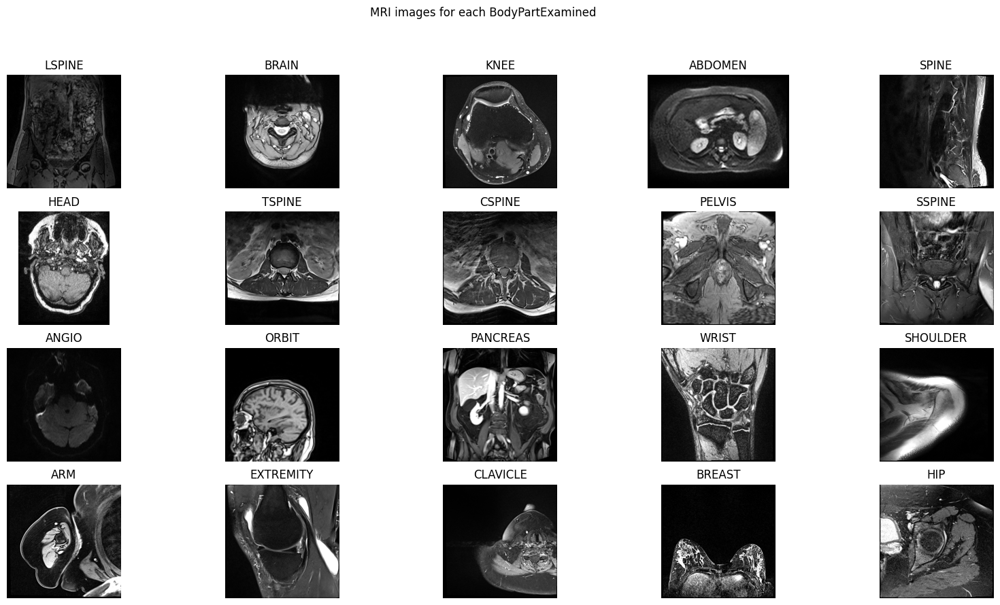

In [24]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

parameter = "BodyPartExamined"

images_path = os.path.join(dataset_root, "pngs")

helpers.plot_image(df_mri, parameter, images_path)


## Protocol name

Now let's look at clustering and some images for protocol name

In [25]:
parameter = "ProtocolName"
helpers.plot_clusters(df_mri, parameter)


Similar to the previous case we can see that our embeddings paired with clustering technique give us a good separation of the data points based on the ProtocolName. This is a good sign that our embeddings are capturing the underlying structure of the data.

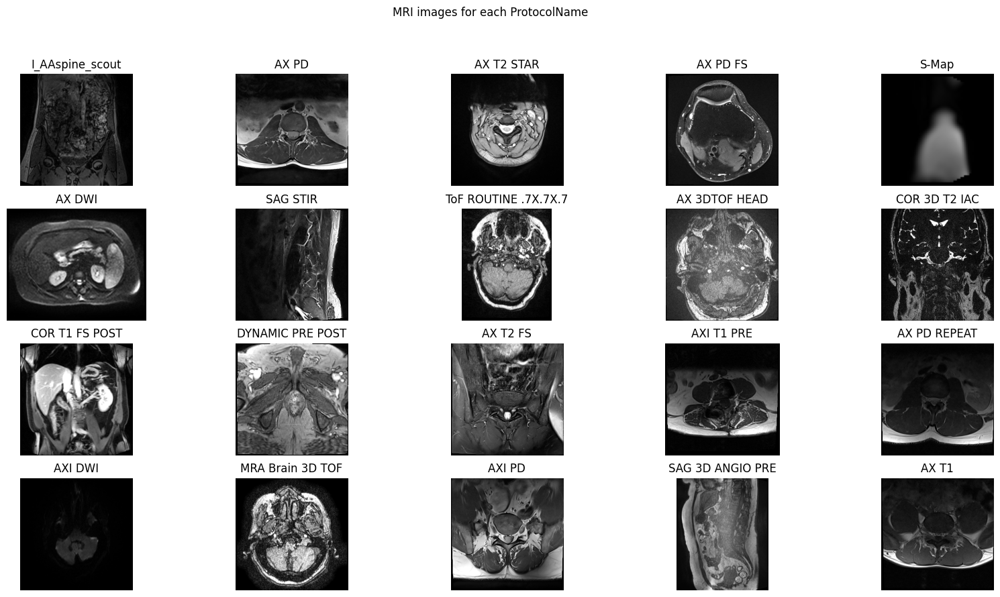

In [26]:
helpers.plot_image(df_mri, parameter, images_path)


## GPT-derived clusters

Now lets label our items with GPT-derived labels and see if those end up being better clusters

In [27]:
with open(gpt_labeled_mri_file_name, "r") as file:
    gpt_labels = json.load(file)

labels_dict = {item["SeriesInstanceUID"]: item["gpt_label"] for item in gpt_labels}

# Add GPT labels to df_mri based on SeriesInstanceUID
def add_labels(df, labels):
    df["BodyPartExamined_gpt"] = df["SeriesInstanceUID"].map(
        lambda uid: labels.get(uid, {}).get("Body Part Examined")
    )
    df["ImagingPlane_gpt"] = df["SeriesInstanceUID"].map(
        lambda uid: labels.get(uid, {}).get("Plane of Imaging")
    )
    df["ProtocolUsed_gpt"] = df["SeriesInstanceUID"].map(
        lambda uid: labels.get(uid, {}).get("Protocol Used")
    )


add_labels(df_mri, labels_dict)


In [28]:
# Now do the same for holdout set
for key in holdout_set:
    add_labels(holdout_set[key], labels_dict)


Let's look at distribution of GPT-derived imaging plane options now

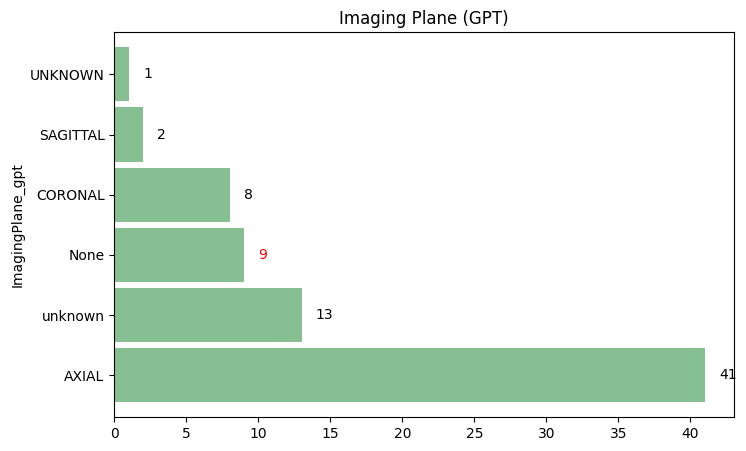

In [29]:
parameter = "ImagingPlane_gpt"
helpers.plot_parameter_distribution_categorical(
    df_mri, parameter, "Imaging Plane (GPT)"
)


We can see the balance of our classes between the three cardinal imaging planes - axial, coronal and sagittal, but also we can see some deficiencies of our labeling method since many series ended up being labeled as "unknown" or "none"

Let's plot the clusters and some images:

In [30]:
helpers.plot_clusters(df_mri, parameter)


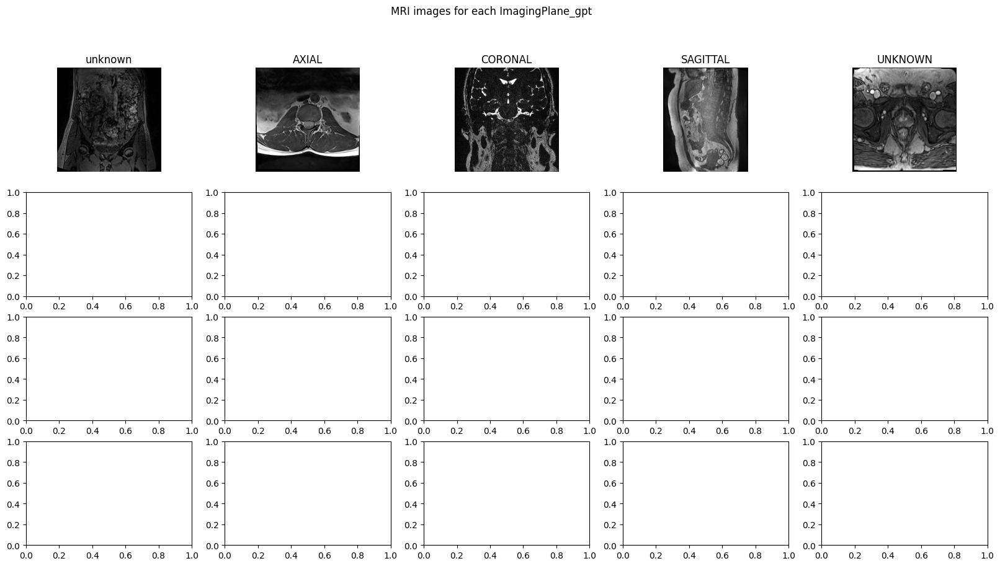

In [31]:
helpers.plot_image(df_mri, parameter, images_path)


Let's look at GPT-derived body part imaged

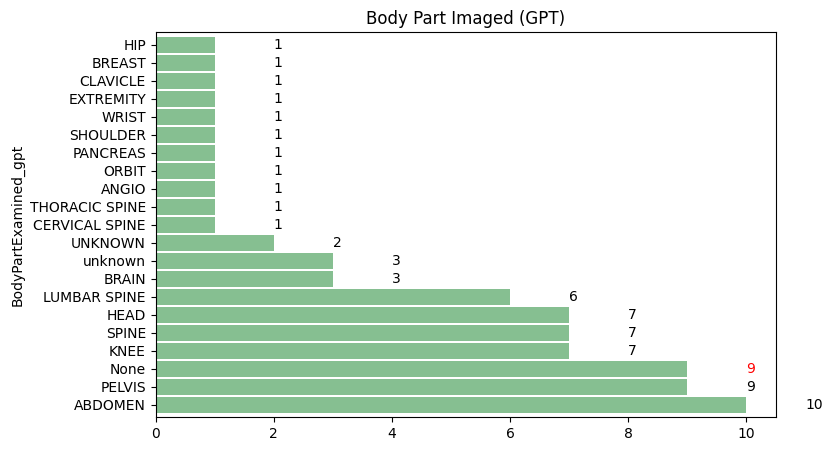

In [32]:
parameter = "BodyPartExamined_gpt"
helpers.plot_parameter_distribution_categorical(
    df_mri, parameter, "Body Part Imaged (GPT)"
)


In [33]:
helpers.plot_clusters(df_mri, parameter)


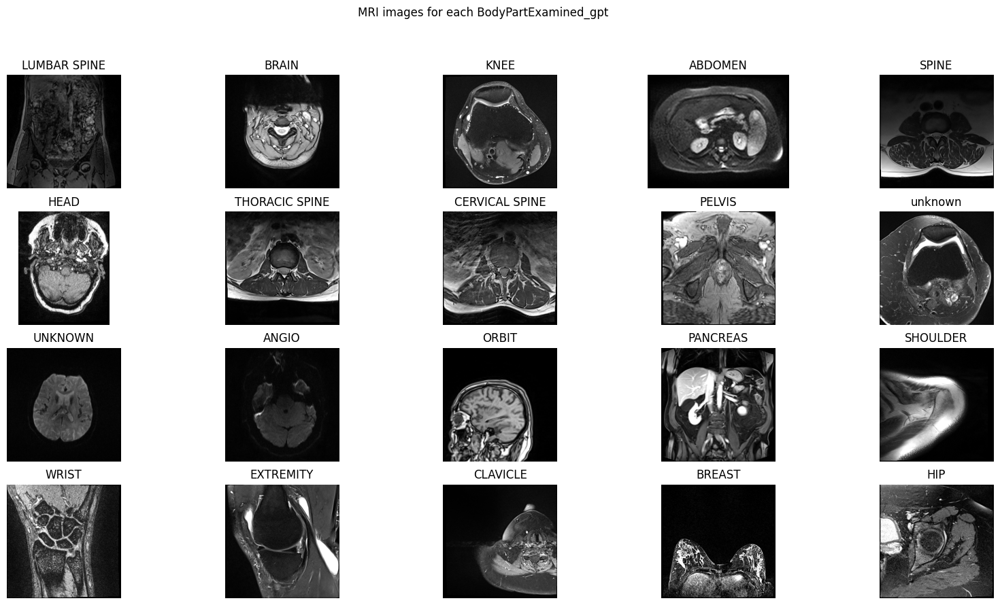

In [34]:
helpers.plot_image(df_mri, parameter, images_path)


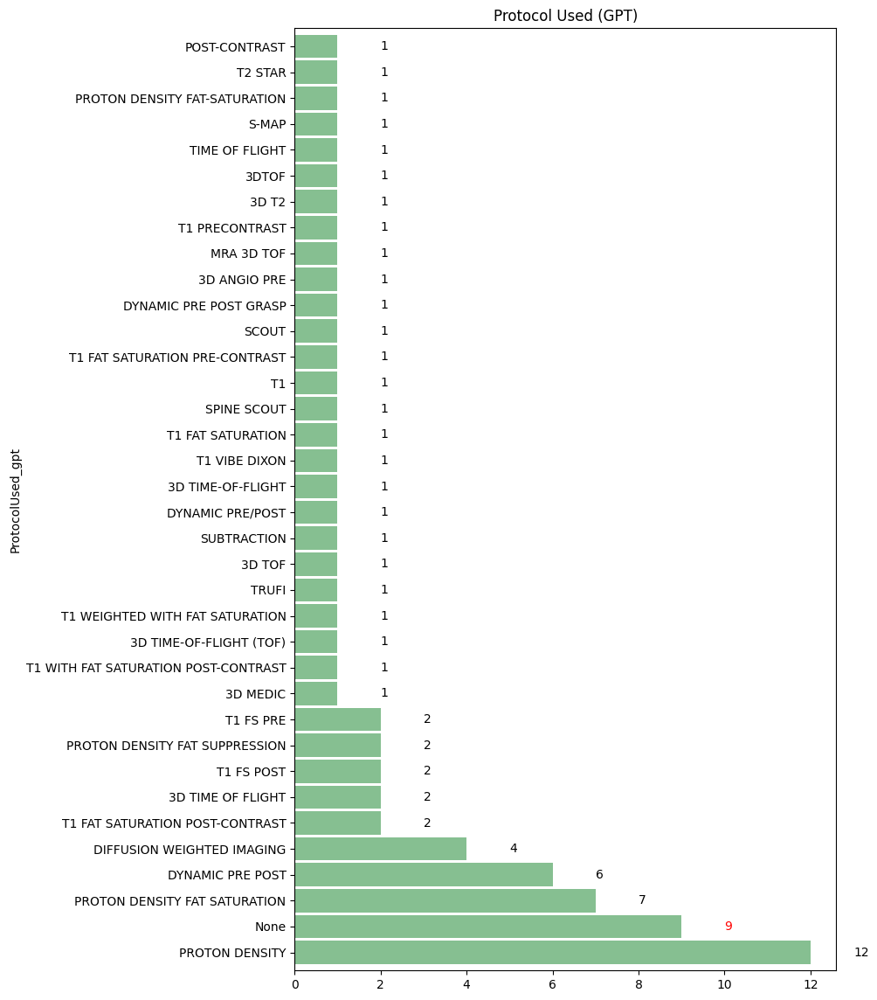

In [35]:
parameter = "ProtocolUsed_gpt"
helpers.plot_parameter_distribution_categorical(
    df_mri, parameter, "Protocol Used (GPT)", height=14
)


Here we see that our GPT-based labeling approach has failed to produce a good, concise set of classes and ended up with a large variety of class labels which will not be a good set of labels in our dataset of 250 series. In this particular scenario this would be an indication that a better prompting technique is needed (such as including a dictionary to choose from in our prompt, or manual review and reconciliation of labels)

# 5. Test the model

And now let's get to the final step of our exam parameter detection system and look at images from our holdout set and try to use our clusters to try and derive their parameters. For this we will use cosine similarity to find the images closest to our image in among the clusters and visualize them. For simplicity we only visualize one slice of the series while recognizing that full visual inspection would require the capability to review the entire 3D image in a specialized viewer.

## Body Part Imaged

Unnamed: 0                                                                      52
batch                                                                          NaN
series_path                      1.3.6.1.4.1.55648.9431494696352837143467064372...
n_files                                                                        812
series_loaded_correctly                                                       True
series_error_description                                                       NaN
series_reader.Execute()                                                 191.390723
reading metadata                                                          0.000368
SpecificCharacterSet                                                    ISO_IR 100
ImageType                                            ORIGINAL\PRIMARY\M\NORM\DIS2D
SOPClassUID                                              1.2.840.10008.5.1.4.1.1.4
SOPInstanceUID                   1.3.6.1.4.1.55648.9431494696352837143467064372...
Stud

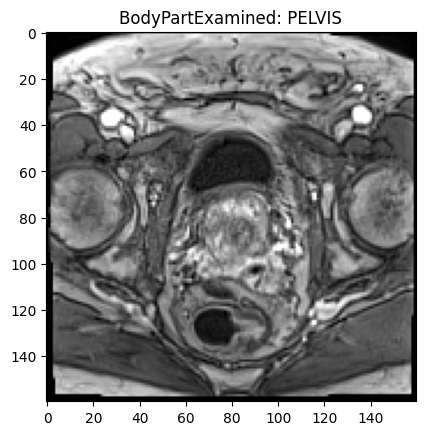

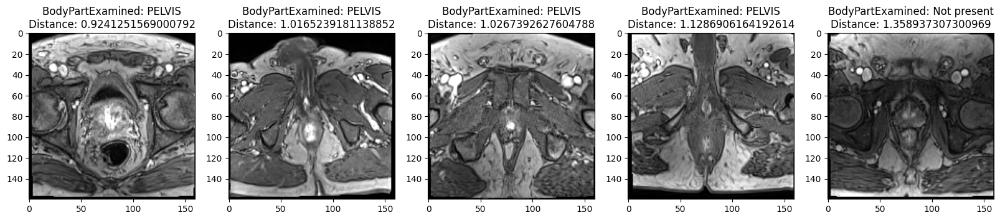

In [36]:
def show_matching_images(id, parameter):
    id_to_test = id
    test_series = df_mri[
        df_mri["SeriesInstanceUID"]
        == holdout_set[parameter].iloc[id_to_test]["SeriesInstanceUID"]
    ].iloc[0]
    print(test_series.to_string())

    helpers.display_closest_images(
        df_mri,
        parameter,
        test_series,
        images_path=images_path,
        features_path=feature_vectors_path,
    )


show_matching_images(1, "BodyPartExamined")


In this example the study tagged as "Pelvis" ended up close to studies tagged as "Abdomen" and "Pancreas" which is a good match

Unnamed: 0                                                                     123
batch                                                                          NaN
series_path                      1.3.6.1.4.1.55648.8303711928810683927034638554...
n_files                                                                         40
series_loaded_correctly                                                       True
series_error_description                                                       NaN
series_reader.Execute()                                                  35.902482
reading metadata                                                          0.000163
SpecificCharacterSet                                                    ISO_IR 100
ImageType                                            ORIGINAL\PRIMARY\M\NORM\DIS2D
SOPClassUID                                              1.2.840.10008.5.1.4.1.1.4
SOPInstanceUID                   1.3.6.1.4.1.55648.8303711928810683927034638554...
Stud

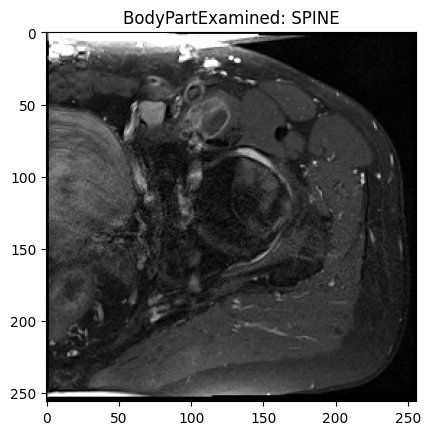

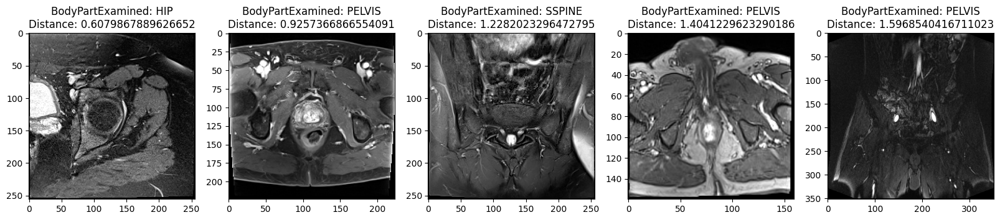

In [37]:
show_matching_images(6, "BodyPartExamined")


In this example a series tagged as "Spine" contains an image of the head and is adequately matched with "Head" and "Brain" as closest 5 matches.

Unnamed: 0                                                                     158
batch                                                                          NaN
series_path                      1.3.6.1.4.1.55648.2139430467378758979356429053...
n_files                                                                        638
series_loaded_correctly                                                       True
series_error_description                                                       NaN
series_reader.Execute()                                                 631.056847
reading metadata                                                          0.000264
SpecificCharacterSet                                                    ISO_IR 100
ImageType                                                 ORIGINAL\PRIMARY\M\DIS2D
SOPClassUID                                              1.2.840.10008.5.1.4.1.1.4
SOPInstanceUID                   1.3.6.1.4.1.55648.2139430467378758979356429053...
Stud

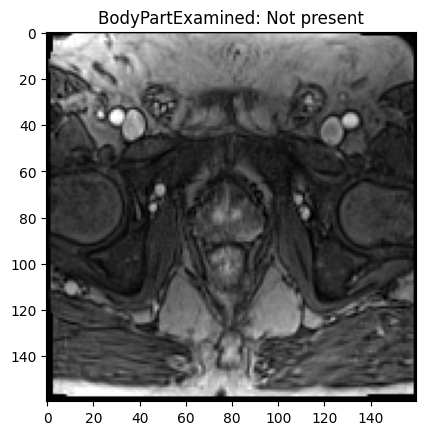

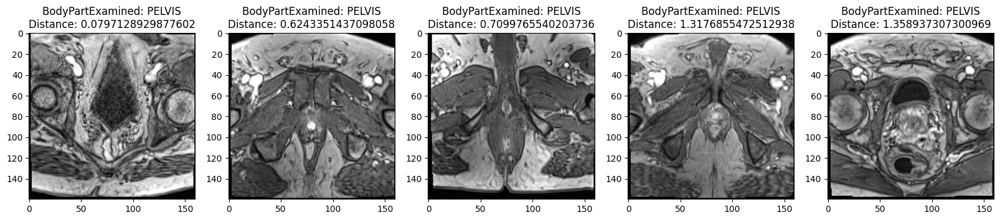

In [38]:
show_matching_images(10, "BodyPartExamined")


Here the image does not contain a value in its "BodyPartExamined" DICOM tag, but clearly contains an image of patient abdomen. It is correctly matched with abdominal scans.

## Protocol Name

Now let's try to predict images using protocol name. These ones are a bit more difficult, but the spot check shows decent capabilities of our system in predicting protocol name.

Unnamed: 0                                                                      52
batch                                                                          NaN
series_path                      1.3.6.1.4.1.55648.9431494696352837143467064372...
n_files                                                                        812
series_loaded_correctly                                                       True
series_error_description                                                       NaN
series_reader.Execute()                                                 191.390723
reading metadata                                                          0.000368
SpecificCharacterSet                                                    ISO_IR 100
ImageType                                            ORIGINAL\PRIMARY\M\NORM\DIS2D
SOPClassUID                                              1.2.840.10008.5.1.4.1.1.4
SOPInstanceUID                   1.3.6.1.4.1.55648.9431494696352837143467064372...
Stud

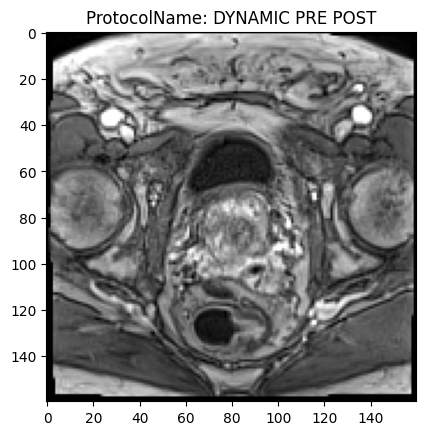

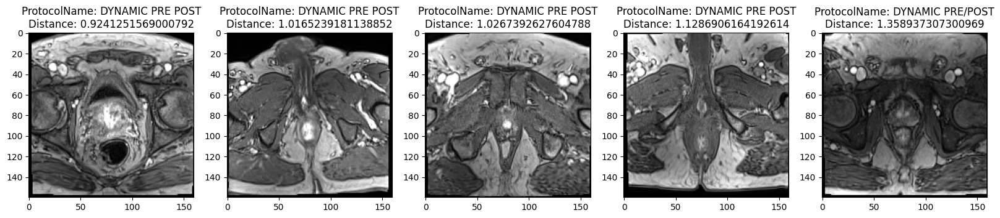

In [39]:
show_matching_images(1, "ProtocolName")


Unnamed: 0                                                                      74
batch                                                                          NaN
series_path                      1.3.6.1.4.1.55648.4075545966109401753320778291...
n_files                                                                         54
series_loaded_correctly                                                       True
series_error_description                                                       NaN
series_reader.Execute()                                                  53.468342
reading metadata                                                          0.000168
SpecificCharacterSet                                                    ISO_IR 100
ImageType                                            ORIGINAL\PRIMARY\M\NORM\DIS2D
SOPClassUID                                              1.2.840.10008.5.1.4.1.1.4
SOPInstanceUID                   1.3.6.1.4.1.55648.4075545966109401753320778291...
Stud

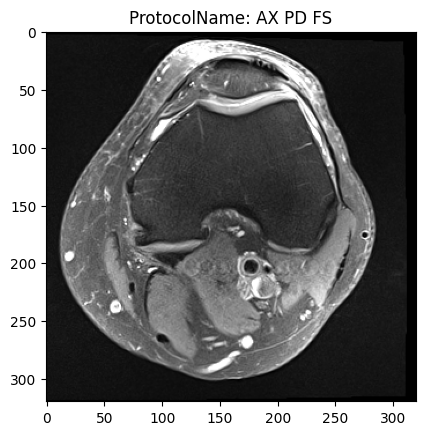

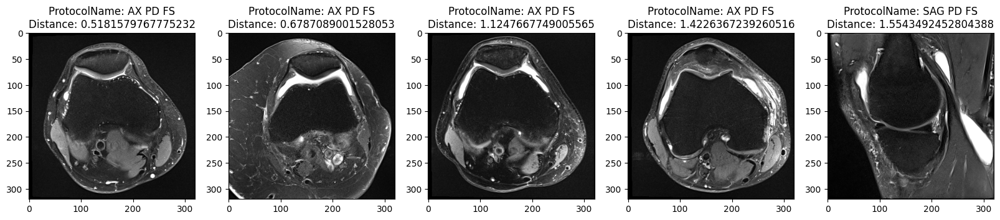

In [40]:
show_matching_images(6, "ProtocolName")


## Matching to GPT-derived clusters

Now let's see how similarity shows up if we use GPT-derived labels

### Body part examined

Unnamed: 0                                                                      52
batch                                                                          NaN
series_path                      1.3.6.1.4.1.55648.9431494696352837143467064372...
n_files                                                                        812
series_loaded_correctly                                                       True
series_error_description                                                       NaN
series_reader.Execute()                                                 191.390723
reading metadata                                                          0.000368
SpecificCharacterSet                                                    ISO_IR 100
ImageType                                            ORIGINAL\PRIMARY\M\NORM\DIS2D
SOPClassUID                                              1.2.840.10008.5.1.4.1.1.4
SOPInstanceUID                   1.3.6.1.4.1.55648.9431494696352837143467064372...
Stud

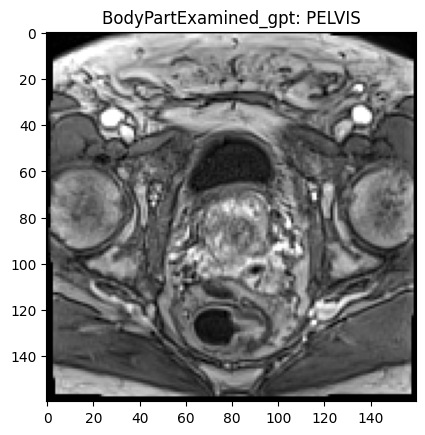

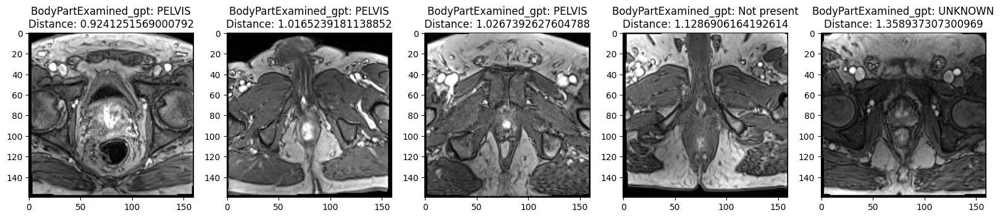

In [41]:
parameter = "BodyPartExamined_gpt"
id_to_test = 1

test_series = df_mri[
    df_mri["SeriesInstanceUID"]
    == holdout_set["BodyPartExamined"].iloc[id_to_test]["SeriesInstanceUID"]
].iloc[0]
print(test_series.to_string())

helpers.display_closest_images(
    df_mri,
    parameter,
    test_series,
    images_path=images_path,
    features_path=feature_vectors_path,
)


Unnamed: 0                                                                      54
batch                                                                          NaN
series_path                      1.3.6.1.4.1.55648.0391683524321780067710581567...
n_files                                                                         25
series_loaded_correctly                                                       True
series_error_description                                                       NaN
series_reader.Execute()                                                  17.265177
reading metadata                                                          0.000158
SpecificCharacterSet                                                    ISO_IR 100
ImageType                                          ORIGINAL\PRIMARY\M\DIS2D\FM\FIL
SOPClassUID                                              1.2.840.10008.5.1.4.1.1.4
SOPInstanceUID                   1.3.6.1.4.1.55648.0391683524321780067710581567...
Stud

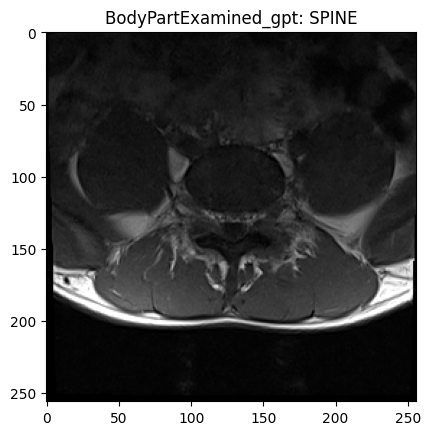

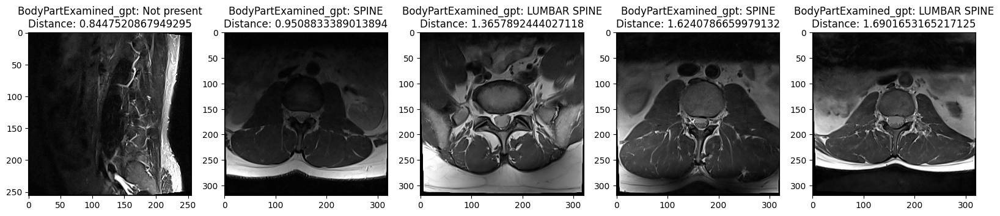

In [42]:
parameter = "BodyPartExamined_gpt"
id_to_test = 5

test_series = df_mri[
    df_mri["SeriesInstanceUID"]
    == holdout_set["BodyPartExamined"].iloc[id_to_test]["SeriesInstanceUID"]
].iloc[0]
print(test_series.to_string())

helpers.display_closest_images(
    df_mri,
    parameter,
    test_series,
    images_path=images_path,
    features_path=feature_vectors_path,
)


### Imaging Plane

Unnamed: 0                                                                      35
batch                                                                          NaN
series_path                      1.3.6.1.4.1.55648.3079392149280414786454528200...
n_files                                                                         25
series_loaded_correctly                                                       True
series_error_description                                                       NaN
series_reader.Execute()                                                  19.116939
reading metadata                                                          0.000163
SpecificCharacterSet                                                    ISO_IR 100
ImageType                                     ORIGINAL\PRIMARY\M\NORM\DIS2D\FM\FIL
SOPClassUID                                              1.2.840.10008.5.1.4.1.1.4
SOPInstanceUID                   1.3.6.1.4.1.55648.3079392149280414786454528200...
Stud

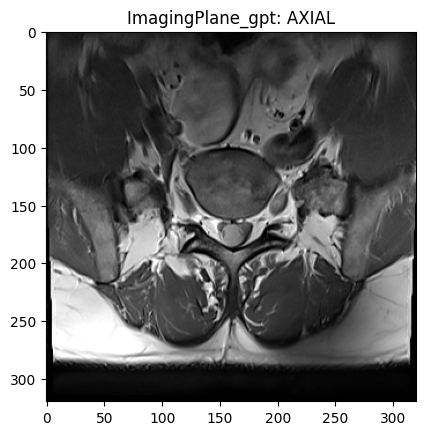

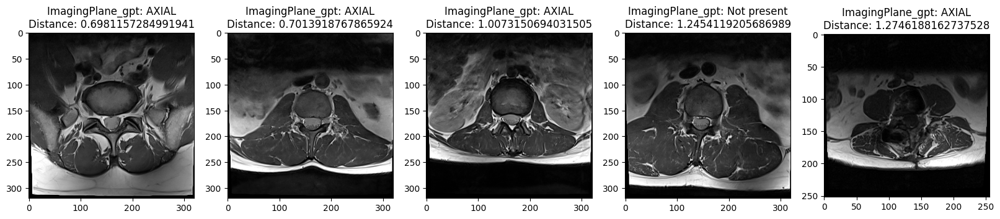

In [48]:
parameter = "ImagingPlane_gpt"
id_to_test = 2

test_series = df_mri[
    df_mri["SeriesInstanceUID"]
    == holdout_set["SeriesDescription"].iloc[id_to_test]["SeriesInstanceUID"]
].iloc[0]
print(test_series.to_string())

helpers.display_closest_images(
    df_mri,
    parameter,
    test_series,
    images_path=images_path,
    features_path=feature_vectors_path,
)


Unnamed: 0                                                                     107
batch                                                                          NaN
series_path                      1.3.6.1.4.1.55648.1884814586401934966180452317...
n_files                                                                        696
series_loaded_correctly                                                       True
series_error_description                                                       NaN
series_reader.Execute()                                                 670.710396
reading metadata                                                           0.00036
SpecificCharacterSet                                                    ISO_IR 100
ImageType                                            ORIGINAL\PRIMARY\M\NORM\DIS2D
SOPClassUID                                              1.2.840.10008.5.1.4.1.1.4
SOPInstanceUID                   1.3.6.1.4.1.55648.1884814586401934966180452317...
Stud

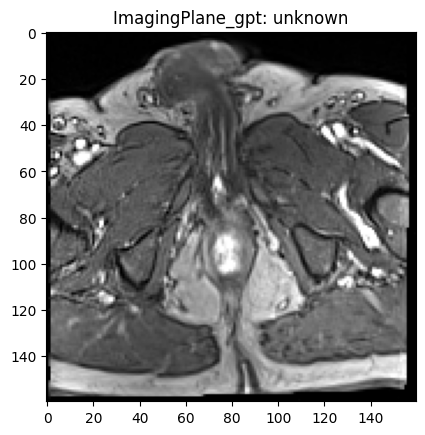

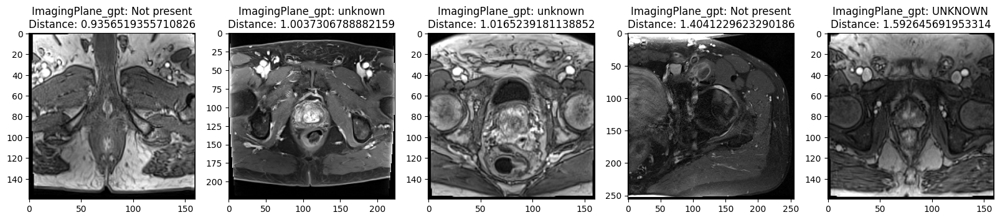

In [49]:
parameter = "ImagingPlane_gpt"
id_to_test = 2

test_series = df_mri[
    df_mri["SeriesInstanceUID"]
    == holdout_set["BodyPartExamined"].iloc[id_to_test]["SeriesInstanceUID"]
].iloc[0]
print(test_series.to_string())

helpers.display_closest_images(
    df_mri,
    parameter,
    test_series,
    images_path=images_path,
    features_path=feature_vectors_path,
)


Unnamed: 0                                                                      60
batch                                                                          NaN
series_path                      1.3.6.1.4.1.55648.9517445473610392984238102446...
n_files                                                                        696
series_loaded_correctly                                                       True
series_error_description                                                       NaN
series_reader.Execute()                                                 160.682367
reading metadata                                                          0.000305
SpecificCharacterSet                                                    ISO_IR 100
ImageType                                            ORIGINAL\PRIMARY\M\NORM\DIS2D
SOPClassUID                                              1.2.840.10008.5.1.4.1.1.4
SOPInstanceUID                   1.3.6.1.4.1.55648.9517445473610392984238102446...
Stud

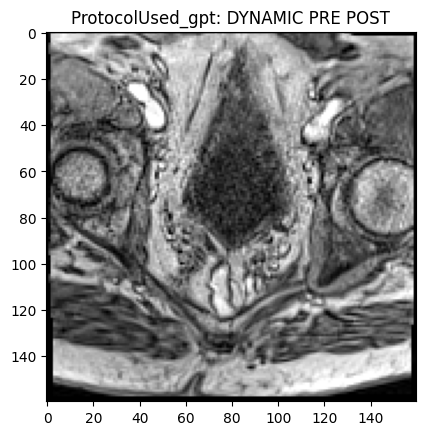

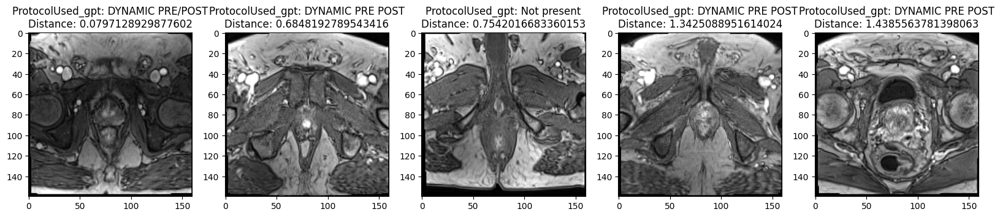

In [50]:
parameter = "ProtocolUsed_gpt"
id_to_test = 2

test_series = df_mri[
    df_mri["SeriesInstanceUID"]
    == holdout_set["ProtocolName"].iloc[id_to_test]["SeriesInstanceUID"]
].iloc[0]
print(test_series.to_string())

helpers.display_closest_images(
    df_mri,
    parameter,
    test_series,
    images_path=images_path,
    features_path=feature_vectors_path,
)


Unnamed: 0                                                                     167
batch                                                                          NaN
series_path                      1.3.6.1.4.1.55648.1488545711202186295325553192...
n_files                                                                        156
series_loaded_correctly                                                       True
series_error_description                                                       NaN
series_reader.Execute()                                                 158.010858
reading metadata                                                          0.000167
SpecificCharacterSet                                                    ISO_IR 100
ImageType                                            ORIGINAL\PRIMARY\M\NORM\DIS2D
SOPClassUID                                              1.2.840.10008.5.1.4.1.1.4
SOPInstanceUID                   1.3.6.1.4.1.55648.1488545711202186295325553192...
Stud

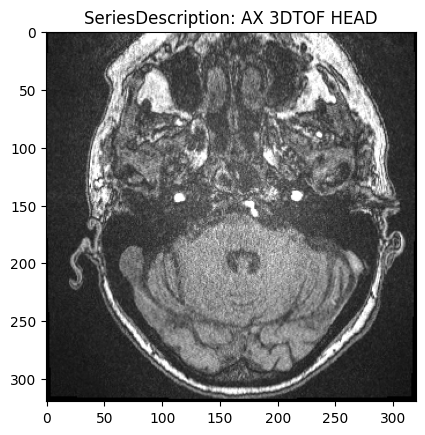

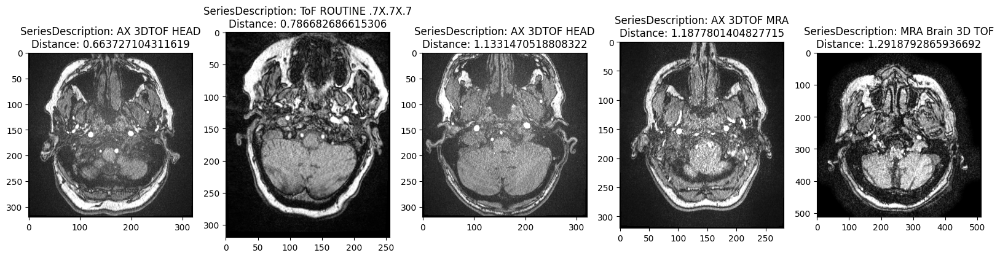

In [46]:
protocol = "3D TOF"

test_series = df_mri[df_mri["ProtocolUsed_gpt"] == protocol].iloc[0]
print(test_series.to_string())

helpers.display_closest_images(
    df_mri,
    "SeriesDescription",
    test_series,
    images_path=images_path,
    features_path=feature_vectors_path,
)


# 6. Final Remarks

Throughout this notebook we have seen how a dataset of MRI series presents a challenge when we are trying to automate identification of certain parameters of imaging series such as body part, protocol or plane of imaging. We have then seen how embeddings obtained by the 2D MedImageInsight model can be used to create low-dimensional representations of entire imaging series, and how these representations can be organized into clusters. We have discussed how our exam parameter detection system would require ground truth labels to understand what are the exam parameters of the clustered images and looked at the example of how GPT4 can be used to provide a good approximation of such labels without any manual effort. We have then inspected these clusters with respect to various parameters of interest and have seen that the model is able to separate the parameters of interest well. We have visualized several images to get a better understanding of model performance and then used our clusters to infer exam parameters of images not used for cluster creation. 

From this place, in order to build a robust exam parameter inference system we would need to look at the following:
- Evaluate the baseline performance of the presented system as a multi-class and multi-label classifier
- Understand the performance requirements for operating such a system in your environment and see if the performance needs to be improved
- If the performance needs to be improved, consider some of the following ideas:
    - creating clusters in a space with more dimensions (keeping in mind that each jump in dimension might require quite a bit more data)
    - using hierarchical clustering techniques to incorporate knowledge about labels and their intrinsic relationship. You might have noticed that in this examples the labels were not used when we created our clusters and clusters were derived solely based on the MedImageInsight representations
    - training a small classifier network on top of derived embeddings to achieve a better classification performance (see our MedImageInsight adapter training notebook)
    - fine-tuning the MedImageInsight model to perform better on your specific imaging set

The ideas presented here can be used to further develop a system that will be able to infer a lot about an imaging study from pixel data only. With MedImageInsight Foundational model such system would not require expensive training, labeling of large datasets, or expensive computational resources to operate. 
